In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from statsmodels.graphics.tsaplots import plot_acf

%matplotlib inline

In [2]:
data_dir = Path.cwd().parent / "data"

df_train_features = pd.read_csv(data_dir / "dengue_features_train.csv")
df_train_labels = pd.read_csv(data_dir / "dengue_labels_train.csv")
df_test_features = pd.read_csv(data_dir / "dengue_features_test.csv")

In [3]:
df_train = df_train_features.copy()
df_train["total_cases"] = df_train_labels["total_cases"]

In [4]:
df_all_features = pd.concat([df_train_features, df_test_features])

In [5]:
df_all_features.shape

(1872, 24)

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

Mostly numeric features. City, year/week of year will be treated as categorical, week_start_date will be treated as a datetime. The target (`total_cases`) is a numeric variable.

In [7]:
# .count() returns non-null rows
null_counts = pd.DataFrame(
    [(len(df_train_features) - df_train_features.count()) / len(df_train_features),
     (len(df_test_features) - df_test_features.count()) / len(df_test_features)]
).transpose().reset_index()
null_counts.rename({"index": "Column", 0: "Train", 1: "Test"}, axis=1, inplace=True)
# Groups Train and Test columns together
null_counts = pd.melt(null_counts, id_vars=["Column"], value_vars=["Train", "Test"]).rename({"variable": "Dataset"}, axis=1)

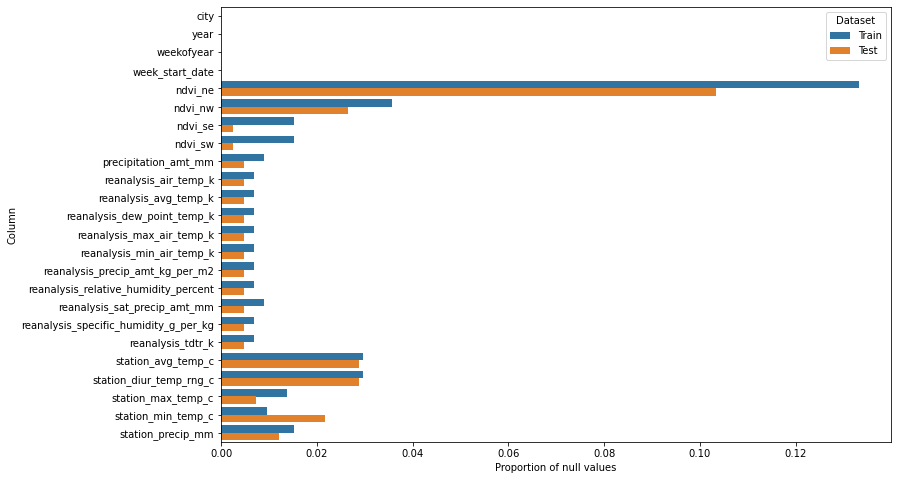

In [8]:
fig, ax = plt.subplots(figsize=(12, 8))
_ = sns.barplot(x="value", y="Column", hue="Dataset", data=null_counts, orient="h", ax=ax)
_ = ax.set_xlabel("Proportion of null values")

Similar proportion of missing values across the Train/Test dataset, except for `ndvi_se` and `ndvi_sw`.

`ndvi_ne` has a significant amount of missing values.

Imputation may be necessary.

## Compare feature between cities (both train and test dataset)

In [9]:
numeric_cols = df_all_features.select_dtypes(include=[np.number]).drop(["year", "weekofyear"], axis=1).columns

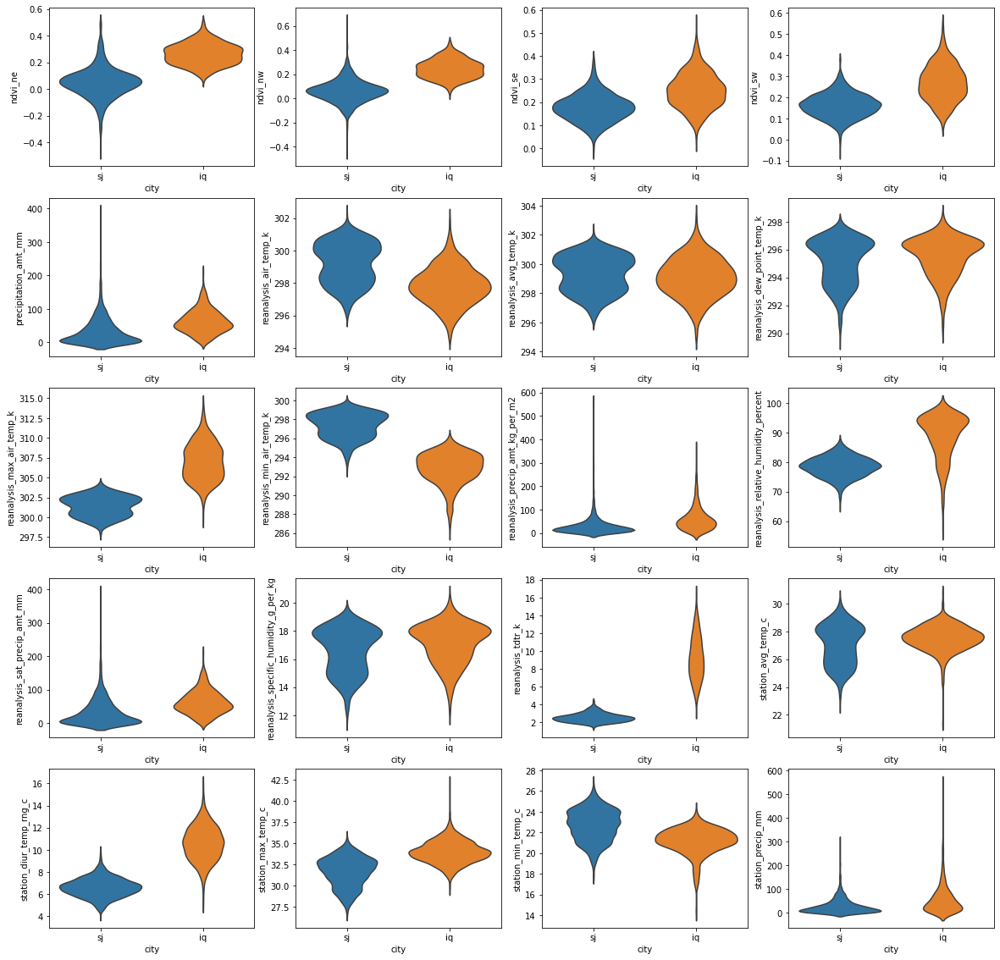

In [10]:
num_cols = int(np.sqrt(len(numeric_cols)))
num_rows = int(np.ceil(len(numeric_cols) / num_cols))

fig, ax = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
for i, col_name in enumerate(numeric_cols):
    col = int(i % num_cols)
    row = int(i / num_cols)
    sns.violinplot(x="city", y=col_name, data=df_all_features, inner=None, ax=ax[row][col])

`reanalysis_max_air_temp_k`, `reanalysis_min_air_temp_k`, `reanalysis_relative_humidity_percent`, `reanalysis_tdtr_k`, `station_diur_temp_rng_c` do not appear to have the same distribution between the two cities.

Some temperature features are reported in kelvin which others in celsius, we should convert all to be consistent. Perhaps to celsius so that the different in mean 

<AxesSubplot:xlabel='year', ylabel='Density'>

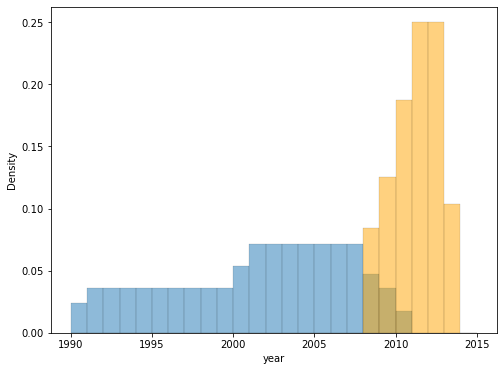

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

sns.histplot(df_train_features["year"], stat="density", bins=np.arange(1990, 2016), alpha=0.5, linewidth=0.1, ax=ax)
sns.histplot(df_test_features["year"], stat="density", bins=np.arange(1990, 2016), color="orange", alpha=0.5, linewidth=0.1, ax=ax)

Measures are taken from different time periods between train and test datasets. There is some overlap between the train and test at 2008-2010.

## Compare train and test features between cities

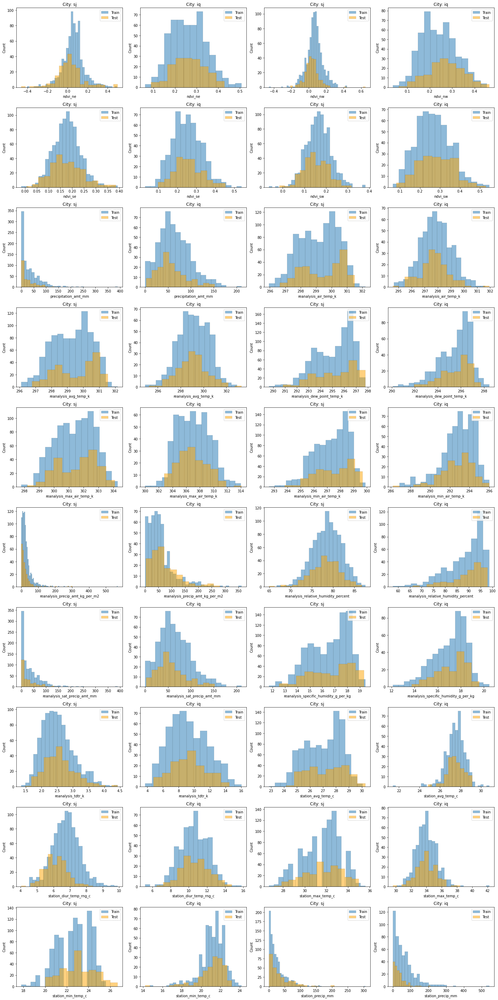

In [12]:
cities = ["sj", "iq"]

num_city = len(cities)
num_cols = int(np.sqrt(len(numeric_cols)))
num_rows = int(np.ceil(len(numeric_cols) / num_cols) * num_city)

fig, ax = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
for i, col_name in enumerate(numeric_cols):
    for j, city in enumerate(cities):
        col = int((i * num_city + j) % num_cols)
        row = int((i * num_city + j) / num_cols)
        sns.histplot(df_train_features[col_name][df_train_features["city"] == city].dropna(),
                     alpha=0.5, linewidth=0.1, label="Train", ax=ax[row][col])
        sns.histplot(df_test_features[col_name][df_test_features["city"] == city].dropna(),
                     color="orange", alpha=0.5, linewidth=0.1, label="Test", ax=ax[row][col])
        ax[row][col].legend(loc="upper right")
        ax[row][col].set_title(f"City: {city}")
fig.tight_layout()

There doesn't appear to be significant differences between the train and test dataset for each city. `nvdi_nw` in `iq` and `station_diur_temp_rng_c` in `sj` appears slightly different.

## Features over time by city

In [13]:
iq_start = df_train_features[df_train_features["city"] == "iq"]["week_start_date"].min()
iq_end = df_train_features[df_train_features["city"] == "iq"]["week_start_date"].max()
sj_start = df_train_features[df_train_features["city"] == "sj"]["week_start_date"].min()
sj_end = df_train_features[df_train_features["city"] == "sj"]["week_start_date"].max()

print(f"iq train date range: {iq_start} to {iq_end}")
print(f"sj train date range: {sj_start} to {sj_end}")

iq train date range: 2000-07-01 to 2010-06-25
sj train date range: 1990-04-30 to 2008-04-22


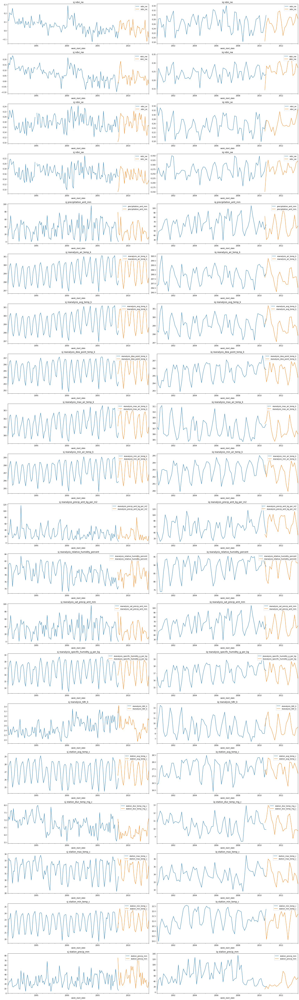

In [14]:
num_numeric_col = len(numeric_cols)
fig, ax = plt.subplots(num_numeric_col, num_city, figsize=(num_city * 12, num_numeric_col * 4))

for j, city in enumerate(cities):
    train_city_rows = df_train_features["city"] == city
    test_city_rows = df_test_features["city"] == city
    train_dates = pd.to_datetime(df_train_features[train_city_rows]["week_start_date"])
    test_dates = pd.to_datetime(df_test_features[test_city_rows]["week_start_date"])
    for i, col_name in enumerate(numeric_cols):
        df_train_features[train_city_rows][
            ["week_start_date", col_name]
        ].set_index(
            pd.DatetimeIndex(df_train_features[train_city_rows]["week_start_date"])
        ).groupby(pd.Grouper(freq="8W")).mean().plot(ax=ax[i][j])
        df_test_features[test_city_rows][
            ["week_start_date", col_name]
        ].set_index(
            pd.DatetimeIndex(df_test_features[test_city_rows]["week_start_date"])
        ).groupby(pd.Grouper(freq="8W")).mean().plot(ax=ax[i][j])

        ax[i][j].set_title(f"{city} {col_name}")
        ax[i][j].legend(loc="upper right")
fig.tight_layout()

Some features show clear cyclical trend, while some show an increase/decreasing trend over the years.

<AxesSubplot:>

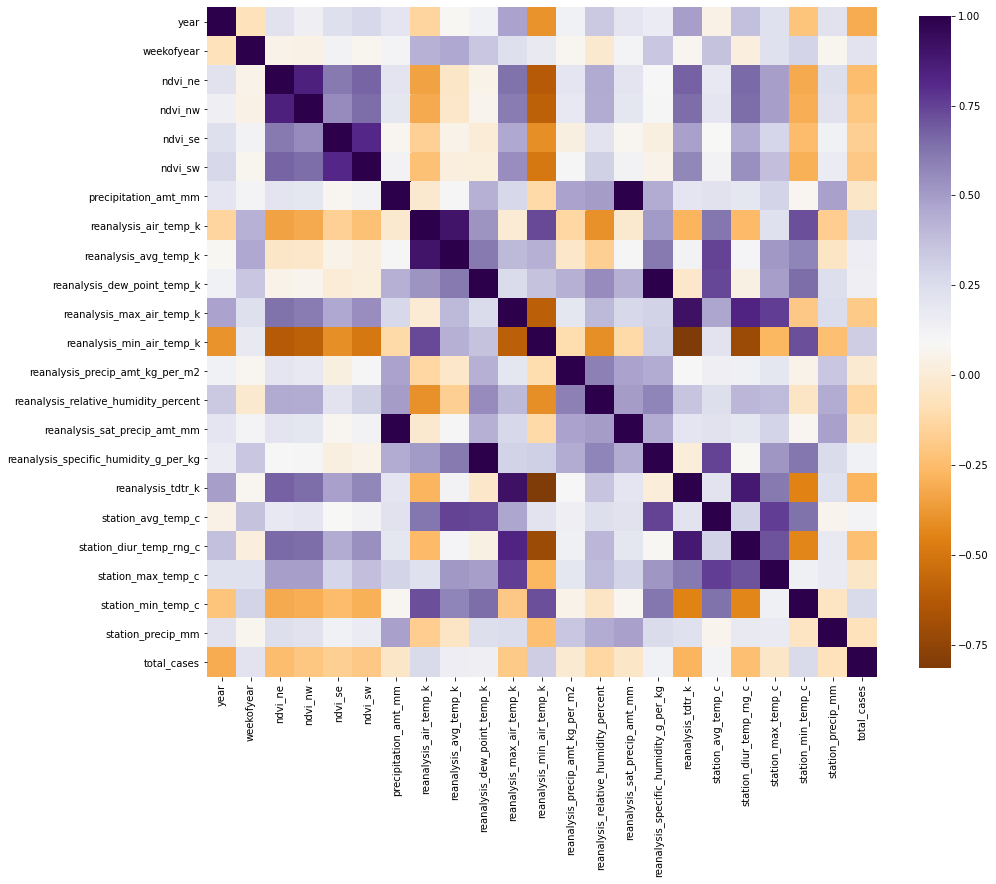

In [15]:
corr = df_train.corr()

fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(data=corr, cmap="PuOr", square=True, cbar_kws={"shrink": 0.8}, ax=ax)

In [16]:
pca_sj = PCA()
pca_iq = PCA()

In [17]:
pca_sj.fit(df_train_features[df_train_features["city"] == "sj"][numeric_cols].dropna())
pca_iq.fit(df_train_features[df_train_features["city"] == "iq"][numeric_cols].dropna())

PCA()

Text(0.5, 1.0, 'PCA | City: iq')

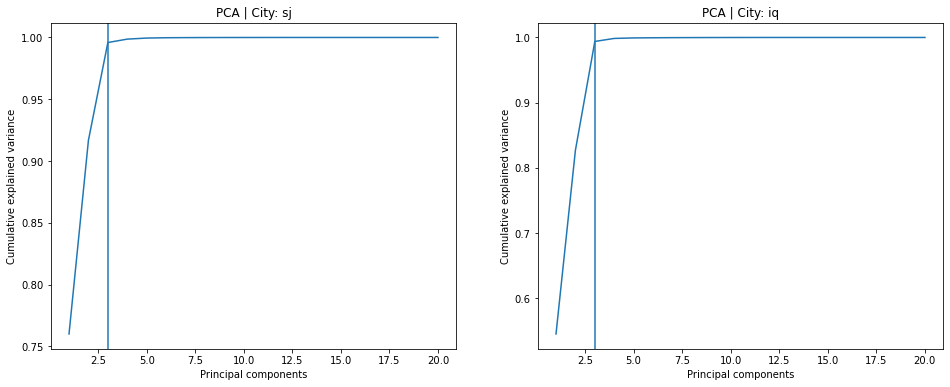

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].plot(np.arange(1, len(pca_sj.explained_variance_ratio_) + 1), np.cumsum(pca_sj.explained_variance_ratio_))
ax[0].axvline(3)
ax[0].set_xlabel("Principal components")
ax[0].set_ylabel("Cumulative explained variance")
ax[0].set_title("PCA | City: sj")

ax[1].plot(np.arange(1, len(pca_iq.explained_variance_ratio_) + 1), np.cumsum(pca_iq.explained_variance_ratio_))
ax[1].axvline(3)
ax[1].set_xlabel("Principal components")
ax[1].set_ylabel("Cumulative explained variance")
ax[1].set_title("PCA | City: iq")

Strong correlations among the numeric weather data, >95% total variance can be explained with 3 principal components in each city.

Text(0.5, 0, 'log(1 + total_cases)')

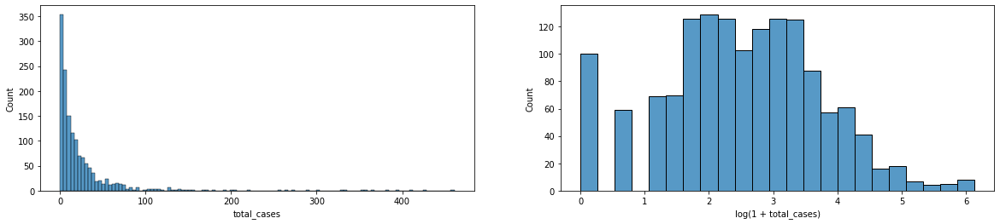

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(20, 4))

sns.histplot(df_train["total_cases"], ax=ax[0])
sns.histplot(np.log(1 + df_train["total_cases"]), ax=ax[1])
ax[1].set_xlabel("log(1 + total_cases)")

Heavy tailed "raw" distribution, suggesting there are outbreaks in the disease. Logging the target makes the distribution look closer to a normal distribution.

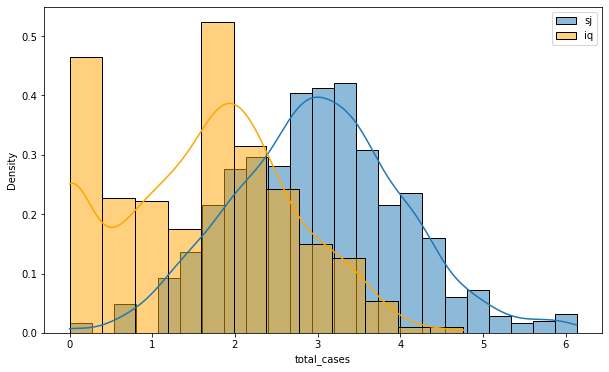

In [20]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.histplot(np.log(1 + df_train[df_train["city"] == "sj"]["total_cases"]), stat="density", kde=True, alpha=0.5, label="sj", ax=ax)
sns.histplot(np.log(1 + df_train[df_train["city"] == "iq"]["total_cases"]), stat="density", kde=True, color="orange", alpha=0.5, label="iq", ax=ax)
ax.legend(loc="upper right")

There is a difference in distribution of cases between the cities. There is a larger number of cases in `sj`.

## Grouping monthly total cases by city

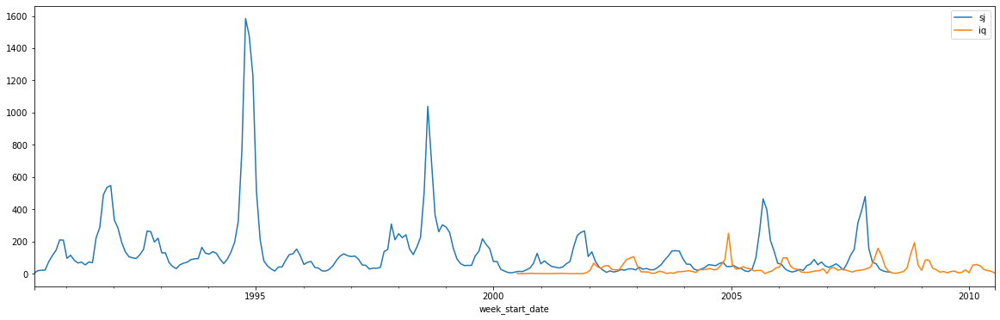

In [21]:
fig, ax = plt.subplots(figsize=(20, 6))

sj_rows = df_train["city"] == "sj"
iq_rows = df_train["city"] == "iq"

df_train[sj_rows][
    ["week_start_date", "total_cases"]
].set_index(
    pd.DatetimeIndex(df_train[sj_rows]["week_start_date"])
).groupby(pd.Grouper(freq="4W")).sum().plot(ax=ax, label="sj")

df_train[iq_rows][
    ["week_start_date", "total_cases"]
].set_index(
    pd.DatetimeIndex(df_train[iq_rows]["week_start_date"])
).groupby(pd.Grouper(freq="4W")).sum().plot(ax=ax)

ax.legend(labels=["sj", "iq"])

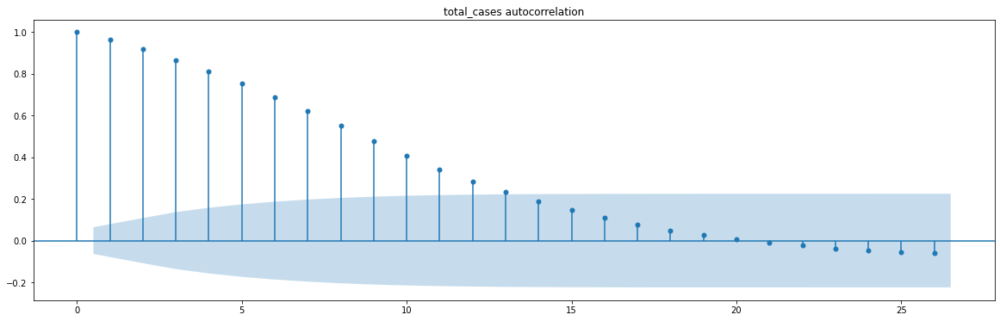

In [22]:
fig, ax = plt.subplots(figsize=(20, 6))
_ = plot_acf(df_train[df_train["city"] == "sj"]["total_cases"], lags=26, title="total_cases autocorrelation", ax=ax)

There is a strong autocorrelation of weekly cases, up to around 13 weeks

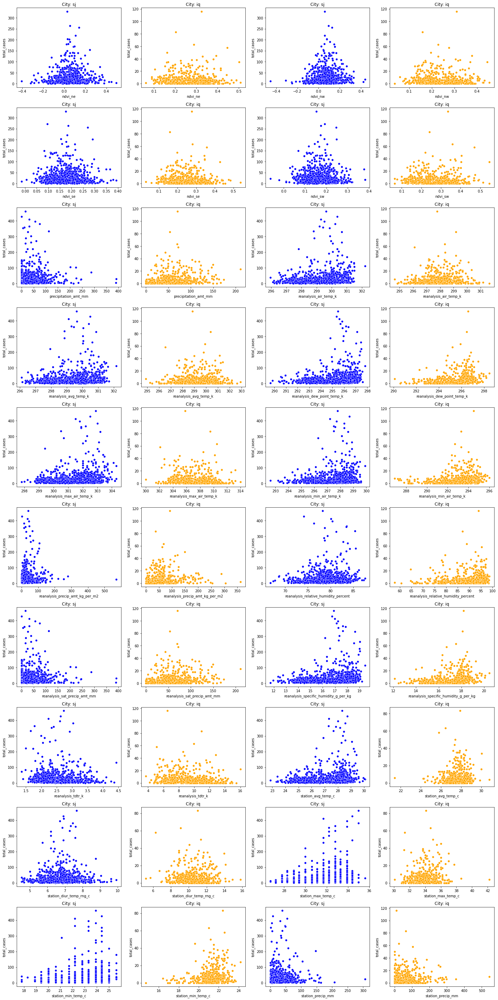

In [23]:
cities = ["sj", "iq"]

num_city = len(cities)
num_cols = int(np.sqrt(len(numeric_cols)))
num_rows = int(np.ceil(len(numeric_cols) / num_cols) * num_city)

fig, ax = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
for i, col_name in enumerate(numeric_cols):
    for j, city in enumerate(cities):
        col = int((i * num_city + j) % num_cols)
        row = int((i * num_city + j) / num_cols)
        sns.scatterplot(df_train[df_train_features["city"] == city][col_name],
                        df_train[df_train_features["city"] == city]["total_cases"],
                        color="blue" if col % 2 == 0 else "orange", ax=ax[row][col])
        ax[row][col].set_title(f"City: {city}")
fig.tight_layout()

`precipitation` related features behaves differently between `sj` and `iq`.

max and min `station_temp` behave differently too, temperature appears to be recorded at lower(?) precision in `sj` than in `iq`. (every 0.5 degC instead of being continuous in `iq`).


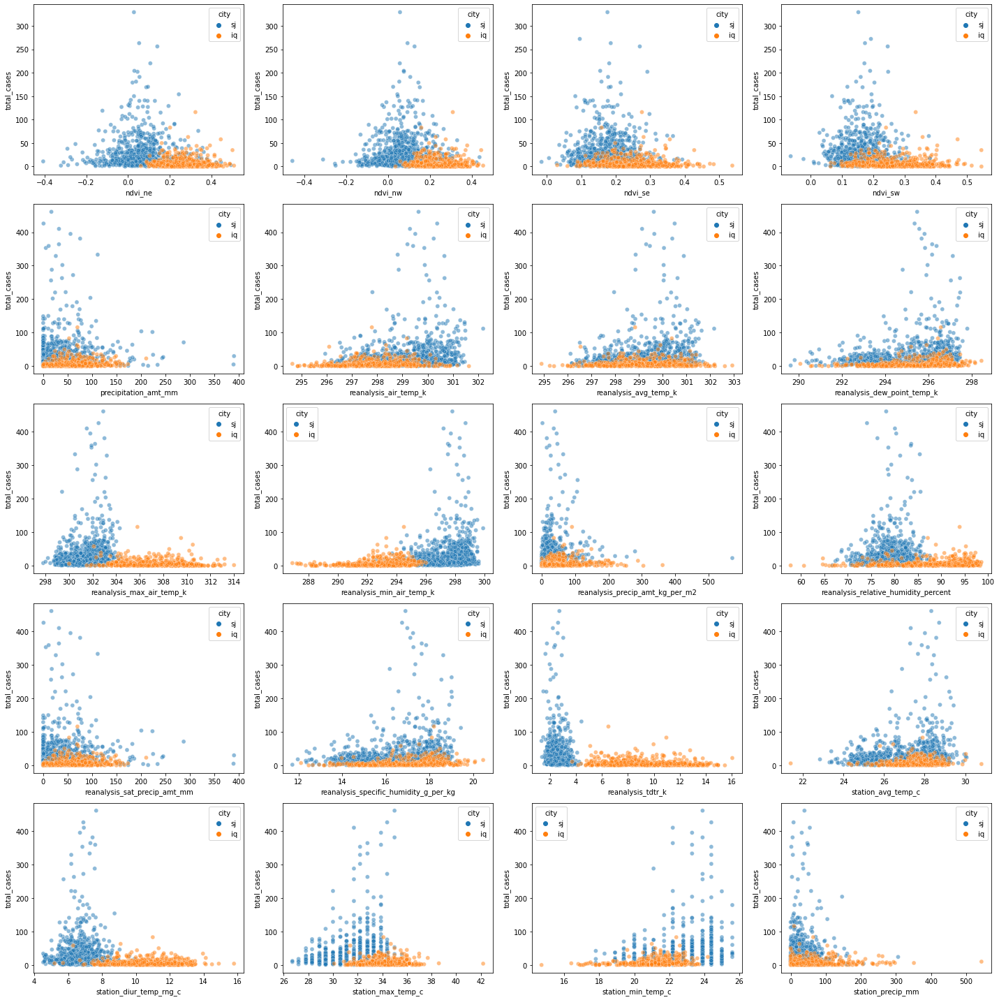

In [24]:
num_cols = int(np.sqrt(len(numeric_cols)))
num_rows = int(np.ceil(len(numeric_cols) / num_cols))

fig, ax = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))
for i, col_name in enumerate(numeric_cols):
    col = int(i % num_cols)
    row = int(i / num_cols)
    sns.scatterplot(x=col_name, y="total_cases", hue="city", data=df_train, alpha=0.5, ax=ax[row][col])
fig.tight_layout()

# Correlation of features with target

In [25]:
df_train[df_train["city"] == "sj"].corr()["total_cases"][: -1].sort_values(ascending=False)

weekofyear                               0.287134
reanalysis_specific_humidity_g_per_kg    0.207947
reanalysis_dew_point_temp_k              0.203774
station_avg_temp_c                       0.196617
reanalysis_max_air_temp_k                0.194532
station_max_temp_c                       0.189901
reanalysis_min_air_temp_k                0.187943
reanalysis_air_temp_k                    0.181917
station_min_temp_c                       0.177012
reanalysis_avg_temp_k                    0.175267
reanalysis_relative_humidity_percent     0.144045
reanalysis_precip_amt_kg_per_m2          0.107457
ndvi_nw                                  0.075307
precipitation_amt_mm                     0.060211
reanalysis_sat_precip_amt_mm             0.060211
station_precip_mm                        0.051759
ndvi_ne                                  0.037639
station_diur_temp_rng_c                  0.034630
ndvi_se                                  0.001113
ndvi_sw                                 -0.000333


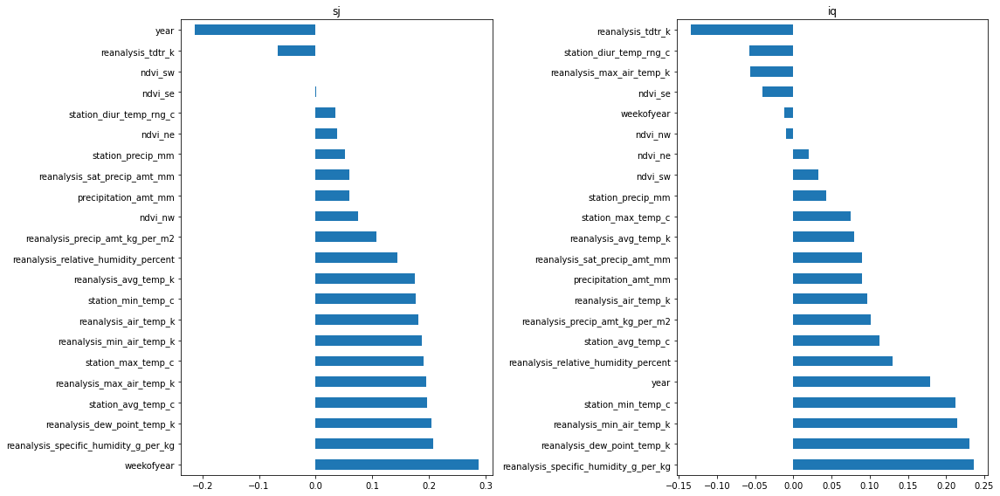

In [26]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

df_train[df_train["city"] == "sj"].corr()["total_cases"][: -1].sort_values(ascending=False).plot.barh(ax=ax[0])
df_train[df_train["city"] == "iq"].corr()["total_cases"][: -1].sort_values(ascending=False).plot.barh(ax=ax[1])

ax[0].set_title("sj")
ax[1].set_title("iq")
fig.tight_layout()

Correlation of features behave differently between the cities.

## Feature importance with random forest

Text(0.5, 1.0, 'Feature importance for sj')

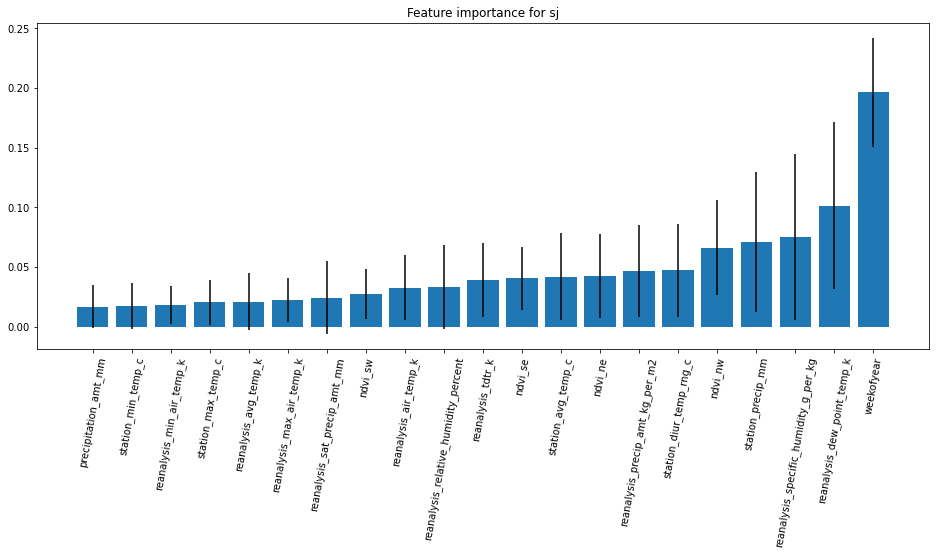

In [27]:
reg_sj = RandomForestRegressor()

rows_sj = df_train["city"] == "sj"
X_sj = df_train[rows_sj].dropna()[numeric_cols.to_list() + ["weekofyear"]]
y_sj = df_train[rows_sj].dropna()["total_cases"]

reg_sj.fit(X_sj, y_sj)

importance_sj = pd.DataFrame(reg_sj.feature_importances_, index=X_sj.columns,
                             columns=["Importance"])
importance_sj["Std"] = np.std([estimator.feature_importances_ for estimator in reg_sj.estimators_], axis=0)
importance_sj = importance_sj.sort_values(by="Importance")

fig, ax = plt.subplots(figsize=(16, 6))
ax.bar(np.arange(importance_sj.shape[0]), importance_sj.iloc[:, 0], yerr=importance_sj.iloc[:, 1])
ax.set_xticks(np.arange(importance_sj.shape[0]))
_ = ax.set_xticklabels(importance_sj.index.to_list(), rotation=80)
ax.set_title("Feature importance for sj")


Text(0.5, 1.0, 'Feature importance for iq')

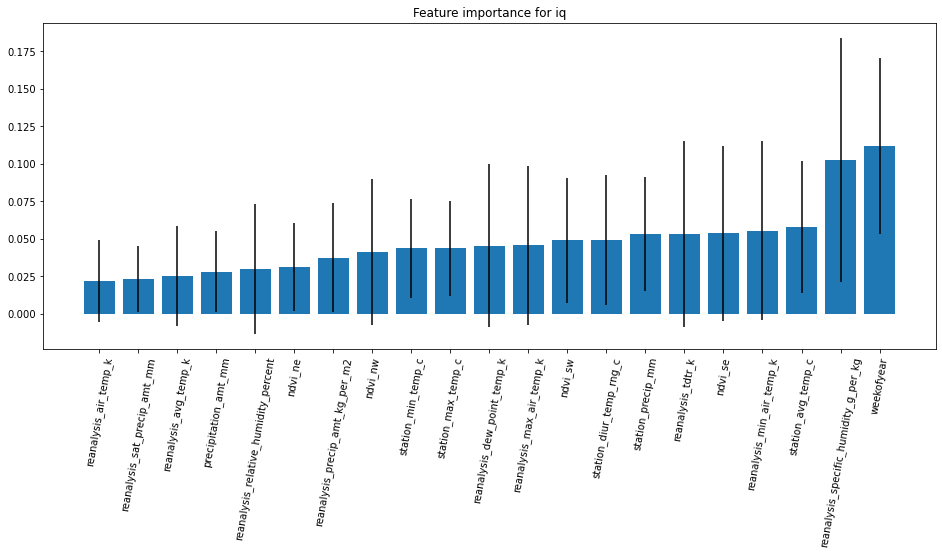

In [28]:
reg_iq = RandomForestRegressor()

rows_iq = df_train["city"] == "iq"
X_iq = df_train[rows_iq].dropna()[numeric_cols.to_list() + ["weekofyear"]]
y_iq = df_train[rows_iq].dropna()["total_cases"]

reg_iq.fit(X_iq, y_iq)

importance_iq = pd.DataFrame(reg_iq.feature_importances_, index=X_iq.columns,
                             columns=["Importance"])
importance_iq["Std"] = np.std([estimator.feature_importances_ for estimator in reg_iq.estimators_], axis=0)
importance_iq = importance_iq.sort_values(by="Importance")

fig, ax = plt.subplots(figsize=(16, 6))
ax.bar(np.arange(importance_iq.shape[0]), importance_iq.iloc[:, 0], yerr=importance_iq.iloc[:, 1])
ax.set_xticks(np.arange(importance_iq.shape[0]))
_ = ax.set_xticklabels(importance_iq.index.to_list(), rotation=80)
ax.set_title("Feature importance for iq")


`weekofyear` and `specific_humidity` appear to be the most important features

# Save as "processed data"

In [29]:
processed_dir = Path.cwd().parent / "data" / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

df_test_features.to_csv(processed_dir / "test.csv", index=False)
df_train.to_csv(processed_dir / "train.csv", index=False)